In [1]:
import IPython.core.display as di

# This line will hide code by default when the notebook is exported as HTML
di.display_html('<script>jQuery(function() {if (jQuery("body.notebook_app").length == 0) { jQuery(".input_area").toggle(); jQuery(".prompt").toggle();}});</script>', raw=True)

# This line will add a button to toggle visibility of code blocks, for use with the HTML export version
di.display_html('''<button onclick="jQuery('.input_area').toggle(); jQuery('.prompt').toggle();">Toggle code</button>''', raw=True)

Toggle code

In [3]:
import numpy as np
import pandas as pd
from IPython.display import Image
import folium
from folium import plugins
from bokeh.io import output_notebook
import matplotlib.pyplot as plt
%matplotlib inline
from bokeh.plotting import figure, save

from bokeh.models import Legend, HoverTool, ColumnDataSource, Panel,HBar, Select,FactorRange,RadioGroup,Div
from bokeh.models.widgets import  Slider, RangeSlider, Tabs

from bokeh.layouts import column, row, WidgetBox

from bokeh.application.handlers import FunctionHandler
from bokeh.application import Application
from bokeh.io import output_notebook,show,output_file
from math import pi
import bokeh.palettes as c
output_notebook()
import warnings
warnings.filterwarnings('ignore')

Loading BokehJS ...

# 1. Motivation

* What is your dataset?
<br> <br>
Motor Vehicle Collisions - Crashes dataset from [New York City OpenData](https://data.cityofnewyork.us/Public-Safety/Motor-Vehicle-Collisions-Crashes/h9gi-nx95).
And some [weather](https://www.kaggle.com/selfishgene/historical-hourly-weather-data) data from kaggle.com 
<br><br>
* Why did you choose this/these particular dataset(s)?
<br><br>
We chose the dataset because we believed that there might be some interesting trends to discover. For example when, why and by whom (vehicle type) accidents happen. Also it is a very big datasat with over a million instances and with different attributes i.e. location, vehicle type, number of people killed/injured.
<br><br>
* What was your goal for the end user's experience?
<br><br>
Our goal was to provide a slideshow for the user where the user can look at the data in different perspectives. We have mainly chosen four perspectives which are location of accidents, time of accidents, vehicle type and contributing factors.


# 2. Basic stats

* Write about your choices in data cleaning and preprocessing
<br><br>
We merged our data with the weather data which reduced the number of instances to 900000. In this data we removed any nan values from the row except for the attributes related to accidents, injuries and killings. In these attributes we changed the nan value to zero instead. However, after realising that the weather had little importance we decided to remove those columns. We also opted to remove all rows which contained ‘PASSENGER VEHICLE’ in the type codes and ‘Unspecified’ on the contributing factors on some of the plot because they were too general and didn’t offer much information.


In [5]:
data_raw = pd.read_csv('Motor_Vehicle_Collisions_-_Crashes.csv', sep=',', error_bad_lines=False, index_col=False, dtype='unicode',low_memory = False)

In [6]:
# list of different injury type victims
injured_killed = list(['NUMBER OF PERSONS INJURED','NUMBER OF PERSONS KILLED', 'NUMBER OF PEDESTRIANS INJURED','NUMBER OF PEDESTRIANS KILLED',
                       'NUMBER OF CYCLIST INJURED','NUMBER OF CYCLIST KILLED', 'NUMBER OF MOTORIST INJURED','NUMBER OF MOTORIST KILLED'])
# list of contributing factor vehicle numbers
cont_factor = list(['CONTRIBUTING FACTOR VEHICLE 1','CONTRIBUTING FACTOR VEHICLE 2', 'CONTRIBUTING FACTOR VEHICLE 3',
       'CONTRIBUTING FACTOR VEHICLE 4', 'CONTRIBUTING FACTOR VEHICLE 5'])

In [7]:
data_raw[injured_killed] = data_raw[injured_killed].fillna(0)

In [8]:
# Casting columns into integer type
data_raw['NUMBER OF PERSONS INJURED'] = data_raw["NUMBER OF PERSONS INJURED"].astype(float).astype(int)
data_raw['NUMBER OF PERSONS KILLED'] = data_raw["NUMBER OF PERSONS KILLED"].astype(float).astype(int)
data_raw['NUMBER OF PEDESTRIANS INJURED'] = data_raw["NUMBER OF PEDESTRIANS INJURED"].astype(float).astype(int)
data_raw['NUMBER OF PEDESTRIANS KILLED'] = data_raw["NUMBER OF PEDESTRIANS KILLED"].astype(float).astype(int)

data_raw['NUMBER OF CYCLIST INJURED'] = data_raw["NUMBER OF CYCLIST INJURED"].astype(float).astype(int)
data_raw['NUMBER OF CYCLIST KILLED'] = data_raw["NUMBER OF CYCLIST KILLED"].astype(float).astype(int)

data_raw['NUMBER OF MOTORIST INJURED'] = data_raw["NUMBER OF MOTORIST INJURED"].astype(float).astype(int)
data_raw['NUMBER OF MOTORIST KILLED'] = data_raw["NUMBER OF MOTORIST KILLED"].astype(float).astype(int)

In [9]:
# Creation of datetime columns
data_raw['CRASH_DATE_TIME'] = pd.to_datetime(data_raw['CRASH DATE'].str[0:10]+' '+data_raw['CRASH TIME'], format = '%m/%d/%Y %H:%M',infer_datetime_format=True)
data_raw['Year'] = data_raw['CRASH_DATE_TIME'].dt.year
data_raw['Hour'] = data_raw['CRASH_DATE_TIME'].dt.hour
data_raw['Weekday'] = data_raw['CRASH_DATE_TIME'].dt.weekday
data_raw['Weekhour'] = data_raw['Hour'] + data_raw['Weekday']*24
# Remove extra spaces at the end of each row
data_raw['ON STREET NAME'] = data_raw['ON STREET NAME'].str.strip()
data_raw['OFF STREET NAME'] = data_raw['OFF STREET NAME'].str.strip()
# Creation of the Intersection column
def intersection(df):
    inter = str(str(df['ON STREET NAME'])+', '+str(df['CROSS STREET NAME']))
    return inter
data_raw['Intersection'] = data_raw.apply(intersection, axis = 1)

In [10]:
# Formatting the original dataset to have a matching style. Also merged two categories which were the same but had different names
data_raw['VEHICLE TYPE CODE 1'] = data_raw['VEHICLE TYPE CODE 1'].str.title()
data_raw['VEHICLE TYPE CODE 2'] = data_raw['VEHICLE TYPE CODE 2'].str.title()
data_raw['VEHICLE TYPE CODE 3'] = data_raw['VEHICLE TYPE CODE 3'].str.title()
data_raw['VEHICLE TYPE CODE 4'] = data_raw['VEHICLE TYPE CODE 4'].str.title()
data_raw['VEHICLE TYPE CODE 5'] = data_raw['VEHICLE TYPE CODE 5'].str.title()
data_raw['CONTRIBUTING FACTOR VEHICLE 1'] = data_raw['CONTRIBUTING FACTOR VEHICLE 1'].str.title()
data_raw['CONTRIBUTING FACTOR VEHICLE 2'] = data_raw['CONTRIBUTING FACTOR VEHICLE 2'].str.title()
data_raw['CONTRIBUTING FACTOR VEHICLE 3'] = data_raw['CONTRIBUTING FACTOR VEHICLE 3'].str.title()
data_raw['CONTRIBUTING FACTOR VEHICLE 4'] = data_raw['CONTRIBUTING FACTOR VEHICLE 4'].str.title()
data_raw['CONTRIBUTING FACTOR VEHICLE 5'] = data_raw['CONTRIBUTING FACTOR VEHICLE 5'].str.title()
data_raw['Intersection'] = data_raw['Intersection'].str.title()
data_raw.replace('Station Wagon/Sport Utility Vehicle', 'Sport Utility / Station Wagon', inplace = True)

In [11]:
# Creation of a filtered dataset which doesn't have categories that have no information, ie. Unknown, Other and Unspecified
# We also removed Passenger Vehicle because it is such a general category that doesn't offer much information
data_raw_filtered = data_raw[(data_raw['VEHICLE TYPE CODE 1'] != 'PASSENGER VEHICLE') & (data_raw['VEHICLE TYPE CODE 2'] != 'PASSENGER VEHICLE')
            & (data_raw['VEHICLE TYPE CODE 3'] != 'PASSENGER VEHICLE') & (data_raw['VEHICLE TYPE CODE 4'] != 'PASSENGER VEHICLE') & 
           (data_raw['VEHICLE TYPE CODE 5'] != 'PASSENGER VEHICLE')]

data_raw_filtered = data_raw[(data_raw['VEHICLE TYPE CODE 1'] != 'UNKNOWN') & (data_raw['VEHICLE TYPE CODE 2'] != 'UNKNOWN')
            & (data_raw['VEHICLE TYPE CODE 3'] != 'UNKNOWN') & (data_raw['VEHICLE TYPE CODE 4'] != 'UNKNOWN') & 
           (data_raw['VEHICLE TYPE CODE 5'] != 'UNKNOWN')]

data_raw_filtered = data_raw[(data_raw['VEHICLE TYPE CODE 1'] != 'OTHER') & (data_raw['VEHICLE TYPE CODE 2'] != 'OTHER')
            & (data_raw['VEHICLE TYPE CODE 3'] != 'OTHER') & (data_raw['VEHICLE TYPE CODE 4'] != 'OTHER') & 
           (data_raw['VEHICLE TYPE CODE 5'] != 'OTHER')]

data_raw_filtered = data_raw[(data_raw['CONTRIBUTING FACTOR VEHICLE 1'] != 'Unspecified') & (data_raw['CONTRIBUTING FACTOR VEHICLE 2'] != 'Unspecified')
           & (data_raw['CONTRIBUTING FACTOR VEHICLE 3'] != 'Unspecified') & (data_raw['CONTRIBUTING FACTOR VEHICLE 4'] != 'Unspecified') &
            (data_raw['CONTRIBUTING FACTOR VEHICLE 5'] != 'Unspecified')]

* Write a short section that discusses the dataset stats, containing key points/plots from your exploratory data analysis.<br><br>

The size of the dataset is 370 MB containing 1.68 million rows and 29 columns.


In [14]:
data_raw_filtered.describe()

,NUMBER OF PERSONS INJURED,NUMBER OF PERSONS KILLED,NUMBER OF PEDESTRIANS INJURED,NUMBER OF PEDESTRIANS KILLED,NUMBER OF CYCLIST INJURED,NUMBER OF CYCLIST KILLED,NUMBER OF MOTORIST INJURED,NUMBER OF MOTORIST KILLED,Year,Hour,Weekday,Weekhour
count,313346.000000,313346.000000,313346.000000,313346.000000,313346.000000,313346.000000,313346.000000,313346.000000,313346.000000,313346.000000,313346.000000,313346.000000
mean,0.360936,0.002320,0.154098,0.001490,0.024120,0.000061,0.182504,0.000769,2016.196559,13.238825,2.888957,82.573784
std,0.679371,0.050253,0.384551,0.038659,0.154913,0.007787,0.597767,0.031087,2.087612,5.813405,1.941059,46.844927
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2012.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2015.000000,9.000000,1.000000,41.000000
50%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2016.000000,14.000000,3.000000,84.000000
75%,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2018.000000,18.000000,4.000000,119.000000
max,31.000000,5.000000,27.000000,2.000000,3.000000,1.000000,31.000000,5.000000,2020.000000,23.000000,6.000000,167.000000


**Plot of Exploratory data analysis**

We used PowerBI to do the exploratory data analysis as it allowed us to quickly filter the data and make different graphs with different types of data. We found that not all columns were usable as some had too much missing data or the data didn’t offer any insight (for example when a type was “Unknown”). Another observation was that the distribution across the year was almost constant. One last interesting point we found was that it seemed as the amount of people killed compared to injured was higher during the night than day, but when plotting the actual ratio we found that wasn’t the case. This might be explained by the fact that the amount of accidents during the night is much lower than during the day, neglecting the apparent trend.

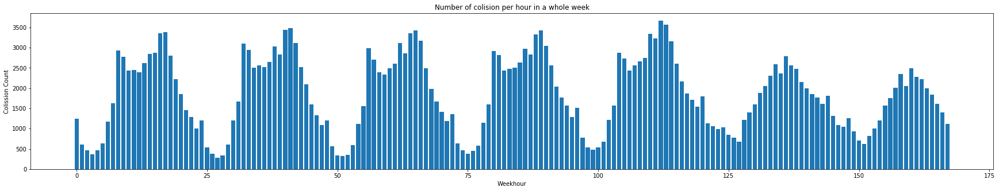

In [24]:
# bar plot of nubmer of vehicle colission per hour in whole week
colission_by_weekhour = data_raw_filtered.groupby(['Weekhour']).size()
colission_counts_weekhour = colission_by_weekhour.loc[colission_by_weekhour.index]
plt.figure(figsize=(30,5))
plt.bar(colission_by_weekhour.index, colission_counts_weekhour)
plt.xlabel('Weekhour')
plt.ylabel('Colission Count')
plt.xticks(rotation=0)
plt.title('Number of colision per hour in a whole week')
plt.show()

<img src="https://github.com/kangas93/Test/raw/master/exploration_pictures/explo_pic4.png" width="500" align="center">

<img src="https://github.com/kangas93/Test/raw/master/exploration_pictures/exploration_pic1.png" width="1044" align="center">

<img src="https://github.com/kangas93/Test/raw/master/exploration_pictures/exploration_pic2.png" width="1044" align="center">

<img src="https://github.com/kangas93/Test/raw/master/exploration_pictures/exploration_pic3.png" width="1044" align="center">

# 3. Data Analysis

* Describe your data analysis and explain what you've learned about the dataset. <br><br>
We have learned that the location of the most common vehicle types are in general spread out quite evenly. However there is a distinct clustering of Taxis in accidents in Manhattan which could make sense. Also the intersections with most accidents/killings/injuries are not always the same but we can see a distinct clustering in Manhattan. Also there are alot more accidents without any injuries or killings compared to the accidents with injuries/killings.
We also learned that the weather seems to not have influence on the accidents and that most vehicles and factors have very similar time distributions. One notable outlier was the Bicycle accidents, which had a peak in summer months suggesting that people bike more in summer than in winter. 
The other thing that was surprising was the fact that since there is little correlation between the accidents and time and weather, it is very hard to predict where the next accident might happen. 


* If relevant, talk about your machine-learning.<br><br>
We attempted to predict where the accident hotspots were based on time and weather data using random forest classifiers. This could be used in real life to have ambulances ready close to said hotspots just by knowing the weather forecast. 
Unfortunately the correlation between these parameters was too low and it only yielded a 8% accuracy when the accidents were grouped in a 5x5km grid, so we decided to not include it in our visualisation.


# 4. Genre

* Which genre of data story did you use?<br><br>
We chose the slideshow genre.
<br><br>
* Which tools did you use from each of the 3 categories of Visual Narrative (Figure 7 in Segal and Heer). Why? <br><br>
From visual structuring we chose Consistent visual platform.
From highlighting we chose Zooming.
From transition guidance we chose Familiar objects (but still cuts).
<br><br>
We choose these tools because they are minimalistic in both their implementation but also visual style. This way we could focus more on the data analysis but still make it easier for the user to view the slideshow.


* Which tools did you use from each of the 3 categories of Narrative Structure (Figure 7 in Segal and Heer). Why?
<br><br>
From ordering we chose Linear. The user can scroll through the plots but there is a clear beginning and end of the slideshow. We believe that this would be the best way to get the user to understand the dataset in terms of the four perspectives we chose.
From interactivity we chose Filtering / Search /  Selection. With most emphasis on filtering. We also chose hover highlighting / details for the map plot.
For the messaging we chose introductory text and captions/headlines.
<br><br>
The common thing with these tools is that they are fairly simple to implement but also gives a minimalistic visual style to the slideshow.


# 5. Visualizations

* Explain the visualizations you've chosen.
<br><br>
We have done map plots and bar plots.
<br><br>
The first map plot is plotting the locations of the most critical intersections when it comes to the total amount of accidents and  number of persons killed or injured. The second map plot is a plot for the accidents location of the most common vehicle types in the dataset.
<br><br>
The first bar plot is related to the number of persons killed/injured with the contributing factors. The dataset contains five columns for contributing factors (f.ex “CONTRIBUTING FACTORS 1”,”CONTRIBUTING FACTORS 2”,.... “CONTRIBUTING FACTORS 5”) and each of the columns contains almost the same types of factors which contributed to the collision. This barplot is designed in such a manner that audiences have the options to choose the different contributing factors such as “CONTRIBUTING FACTORS 1” and different injury types then the bar plot shows the number of persons injured/killed regarding the contribution factors. The audiences also have the options to select the axis type of the plot and most common factors which are involved in the collision by ranging the slider.
<br><br>
The second bar plot lets the user see the time distribution along the day filtering by what the vehicle type code (bicycle, bus, etc)  was and it’s contributing factor (driving too close, inattention, etc). It also allows the user to change whether to look at type 1, 2, etc. or the intersection. When the user changes the vehicle type, the contributing factor changes accordingly.
<br>

* Why are they right for the story you want to tell?
<br><br>
They are right because they give the user an overview in the different perspectives in an easy way and should complement each other. The maplots quickly gives an intuition of the locations of the accidents. The bar plot is a good complement to the map plot since it shows the relation between different attributes for example as time related to vehicle type. Distance is also easier to interpret than area which is why we have chosen to do barplots [1]. The barplot of the contributing factor relates the different accident categories to the underlying cause which makes this the right plot for us.



# 6. Discussion

* What went well?
<br><br>
We managed to create the plots we were after. The division of tasks worked well and we managed to do everything in time.
<br><br>
* What is still missing? What could be improved?, Why?
<br><br>
We could have implemented a website and also made the bokeh apps to load the whole data set. We were not prepared that it would be so hard for us to learn D3.js under the current circumstances. Maybe we could have started researching how to use D3.js earlier but we all had other demanding courses simultaneously which us focus on other tasks instead. 


# 7. Contributions 

* Contributions. Who did what?
You should write (just briefly) which group member was the main responsible for which elements of the assignment. (I want you guys to understand every part of the assignment, but usually there is someone who took the lead role on certain portions of the work. That's what you should explain).
<br><br>
s196655: Did the two map plots. 
<br>
s193074: Did the first crossfilter bokeh bar plot. 
<br>
s200142: Did the time plot with help from the other group members.


# 8. References

[1] DAOST chapter two 

# Our final presentation plots and code for making the plots

The following code is for processing the data for the map plots

In [10]:
# In this section we filter the data on the 'NUMBER OF PERSONS INJURED','NUMBER OF PERSONS KILLED', their lat/longs and the intersection
crossData = data_raw[['LATITUDE','NUMBER OF PERSONS INJURED','NUMBER OF PERSONS KILLED','LONGITUDE','Intersection']]
crossData=crossData[(crossData.LONGITUDE.isnull() == False) & ( crossData.LATITUDE.isnull()== False)]

# We then filter out the part that belongs to the person being injured
crossInjured=crossData[['NUMBER OF PERSONS INJURED','LATITUDE','LONGITUDE','ON STREET NAME', 'CROSS STREET NAME','Intersection']]
crossInjured=crossInjured.dropna(axis=0)

In [11]:
# We create a coordinates dataframe which we will later merge with the aggregated dataframe. We also remove duplicate entries in the coordinates frame.
coordinates=crossInjured[['Intersection', 'LATITUDE', 'LONGITUDE']]
coordNoDup=coordinates.drop_duplicates(subset='Intersection')

# Dropping the latitude and longitude to make it easier to aggregate
crossCount=crossInjured.drop(labels=['LATITUDE', 'LONGITUDE'], axis=1)

In [12]:
# For calculating the sum of injured people
crossSum=crossCount.groupby('Intersection').sum()

# Merging with the coordinates to get the location
merged=coordNoDup.merge(crossSum,how='inner', on='Intersection')

# Sorting the values and then selecting the top ten values
filtInjured=merged.sort_values(by='NUMBER OF PERSONS INJURED',axis=0, ascending=False).iloc[0:10]

In [13]:
# Total number of accidents, here we count the instances on 'NUMBER OF INJURED PERSONS' instead of summing them up
crossCount=crossCount.groupby('Intersection').count()

# We merge with the coordinates and then filter out the topten locations
mergedAcc=coordNoDup.merge(crossCount,on='Intersection')
filtAcc=mergedAcc.sort_values(by='NUMBER OF PERSONS INJURED',axis=0, ascending=False).iloc[0:10]

In [14]:
#Number of persons killed, here we filter in the 'NUMBER OF PERSONS KILLED'
crossKilled=crossData[['NUMBER OF PERSONS KILLED','LATITUDE','LONGITUDE','Intersection']]
crossKilled=crossKilled.dropna(axis=0)

# We exclude every entry that is zero from 'NUMBER OF PERSONS KILLED'
crossKilled=crossKilled[crossKilled['NUMBER OF PERSONS KILLED']>0]

In [15]:
#The same procedure as above, we create a coordinates frame which we later merge with
coordinatesKilled=crossKilled[['Intersection', 'LATITUDE', 'LONGITUDE']]
coordNoDupK=coordinatesKilled.drop_duplicates(subset='Intersection')
crossK=crossKilled.drop(labels=['LATITUDE', 'LONGITUDE'], axis=1)

#We sum the values of 'NUMBER OF PERSONS KILLED' and then filter out the top ten
crossSumK=crossK.groupby('Intersection').sum()
mergedK=coordNoDup.merge(crossSumK,how='inner', on='Intersection')
filtK=mergedK.sort_values(by='NUMBER OF PERSONS KILLED',axis=0, ascending=False).iloc[0:10]

# Map plot of top ten intersections

The map plot below plots the top ten intersections involved in the categories Persons Injured, Persons killed and Accident locations. The last category involves both the accidents where people were injured or killed but also accidents without any injuries.
The circles are clickable and shows the name of the intersection and the  number of instances involved in that accident category. Bigger circles indicate more accidents at that location. In the upper right corner the user can filter between the categories and change map tile.

In [16]:
#TOP THEN INTERSECTIONS FOR ACCIDENTS, KILLED, INJURED

map_hooray = folium.Map(location=[40.730610, -73.935242],tiles='Stamen Watercolor',
                    zoom_start = 11)

# We add another map tile to the the map
folium.TileLayer('Stamen Toner').add_to(map_hooray)

# We add three different groups which you can turn on and off on the map
g1 = folium.FeatureGroup(name='Top ten intersections for accidents')
map_hooray.add_child(g1)

g2 = folium.FeatureGroup(name='Top ten intersections for persons killed')
map_hooray.add_child(g2)


g3 = folium.FeatureGroup(name='Top ten intersections for persons injured')
map_hooray.add_child(g3)

#The colors for coloring the markers with
colors=c.viridis(3)

#Here we add the markers for the stats on 'NUMBER OF PERSONS KILLED'
sumK=filtK['NUMBER OF PERSONS KILLED'].sum(axis=0)
for x in range(0,len(filtK)):
    
    # We calculate a persenatge wich with we scale the radius with
    percentage=filtK['NUMBER OF PERSONS KILLED'].iloc[x]/sumK
    percentage=np.log10(filtK['NUMBER OF PERSONS KILLED'].iloc[x])/np.log10(sumK)
    
    #We create a Iframe which pops up when we click a marker
    intersection=str('\n'+str(filtK['Intersection'].iloc[x]))
    text1=str('Number of persons killed: ')
    text2=str(filtK['NUMBER OF PERSONS KILLED'].iloc[x])
    html="<b>Intersection:</b><p>{}</p> <b> {} </b><p>{}</p>".format(intersection,text1,text2)
    iframe = folium.IFrame(html=html, width=250, height=190)
    p = folium.Popup(iframe, max_width=2650)
    
    #We create the marker with a scaling of the radius and the iframe as the popup text
    folium.CircleMarker([filtK.LATITUDE.iloc[x], filtK.LONGITUDE.iloc[x]],
                        radius=15*percentage,
                        popup=p,
                        color=colors[0], fill=True, opacity=0.3+percentage
                        ).add_to(g2)


#Here we add the markers for the stats on the total number of accidents, the procedure inside the for loops is excatly the 
# same as in the above example. The only differens is the data used.
sumA=filtAcc['NUMBER OF PERSONS INJURED'].sum(axis=0)
for x in range(0,len(filtAcc)):
    
    percentage=np.log10(filtAcc['NUMBER OF PERSONS INJURED'].iloc[x])/np.log10(sumA)
    
    intersection=str('\n'+str(filtAcc['Intersection'].iloc[x]))
    text1=str('Number of accidents: ')
    text2=str(filtAcc['NUMBER OF PERSONS INJURED'].iloc[x])
    html="<b>Intersection:</b><p>{}</p> <b> {} </b><p>{}</p>".format(intersection,text1,text2)
    iframe = folium.IFrame(html=html, width=250, height=190)
    p = folium.Popup(iframe, max_width=2650)

    
    folium.CircleMarker([filtAcc.LATITUDE.iloc[x], filtAcc.LONGITUDE.iloc[x]],
                        radius=15*percentage,
                        popup=p,
                        color=colors[1],fill=True, opacity=0.3+percentage
                        ).add_to(g1)

#Here we add the markers for the stats on 'NUMBER OF INJURED', the procedure inside the for loops is excatly the 
# same as in the above example. The only differens is the data used.
sumJ=filtInjured['NUMBER OF PERSONS INJURED'].sum(axis=0)
for x in range(0,len(filtInjured)):
    percentage=np.log10(filtAcc['NUMBER OF PERSONS INJURED'].iloc[x])/np.log10(sumJ)
    
    intersection=str('\n'+str(filtInjured['Intersection'].iloc[x]))
    text1=str('Number of persons injured: ')
    text2=str(filtInjured['NUMBER OF PERSONS INJURED'].iloc[x])
    html="<strong>Intersection:</strong><p>{}</p> <b> {} </b><p>{}</p>".format(intersection,text1,text2)
    iframe = folium.IFrame(html=html, width=250, height=190)
    p = folium.Popup(iframe, max_width=2650)
    

    folium.CircleMarker([filtInjured.LATITUDE.iloc[x], filtInjured.LONGITUDE.iloc[x]],
                        radius=15*percentage,
                        popup=p,
                        color=colors[2],fill=True, opacity=0.3+percentage
                        ).add_to(g3)

#We make the sidebar to "collapse". If the user hovers over the sidebar icon it folds out.
folium.LayerControl(collapsed=True).add_to(map_hooray)

map_hooray # Calls the map to display

# Map plot of most common vehicle types in accidents

The map plot below plots the accidents locations of a random sample from the most common vehicle types across all time in the dataset. The random sample size is 1000 instances for each vehicle type. The dots are clickable and show the date and time of the crash and also the vehicle type. In the upper right corner the user can filter between vehicle types and change the map tile.

In [17]:
# Here we extract the vehicle type of the first vehicle in the accident.
typeData=data_raw_filtered[['CRASH_DATE_TIME','LATITUDE','LONGITUDE', 'VEHICLE TYPE CODE 1','CONTRIBUTING FACTOR VEHICLE 1','ON STREET NAME', 'CROSS STREET NAME']]
typeData=typeData[(typeData.LONGITUDE.isnull() == False) & ( typeData.LATITUDE.isnull()== False)]
typeData=typeData.dropna(axis=0)

# We filter once again to obtain a list which we can aggregate. This is for finding out the the topten most common car types
oneCar=typeData[['VEHICLE TYPE CODE 1','LATITUDE']]

# We count the number of different vehicle types
oneCar=oneCar.groupby('VEHICLE TYPE CODE 1').count()
toptenCar=oneCar.sort_values(by='LATITUDE',axis=0, ascending=False).iloc[0:10]
namesCar=list(toptenCar.index)

In [18]:
# From the namesCar list we saw which cars are the most popular. We filter out the cars that don't tell us anything
# for example the values "OTHER" or "UNKNOWN".
# We extract a dataframe for each of relevant cars
sport=typeData[typeData['VEHICLE TYPE CODE 1']=='Sport Utility / Station Wagon']
sedan=typeData[typeData['VEHICLE TYPE CODE 1']=='Sedan']
taxi=typeData[typeData['VEHICLE TYPE CODE 1']=='Taxi']
bus=typeData[typeData['VEHICLE TYPE CODE 1']=='Bus']
van=typeData[typeData['VEHICLE TYPE CODE 1']=='Van']
pickup=typeData[typeData['VEHICLE TYPE CODE 1'] == 'Pick-Up Truck']
livery=typeData[typeData['VEHICLE TYPE CODE 1'] == 'Livery Vehicle']

In [19]:
We pick a random sample from each of the different vehicle types to plot.
carList=[sport.sample(1000),sedan.sample(1000),taxi.sample(1000),van.sample(1000), pickup.sample(1000),bus.sample(1000),livery.sample(1000)]

In [20]:
m = folium.Map(location=[40.730610, -73.935242],tiles='Stamen Watercolor',
                    zoom_start = 11)

#We add groups for each vehicle type and add them to a list
g1 = folium.FeatureGroup(name='Sport utility / Station wagon')
m.add_child(g1)

g2 = folium.FeatureGroup(name='Sedan')
m.add_child(g2)

g3 = folium.FeatureGroup(name='Taxi')
m.add_child(g3)

g4 = folium.FeatureGroup(name='Van')
m.add_child(g4)

g5 = folium.FeatureGroup(name='Pick-Up truck')
m.add_child(g5)

g6 = folium.FeatureGroup(name='Bus')
m.add_child(g6)

g7 = folium.FeatureGroup(name='Livery Vehicle')
m.add_child(g7)

group_list=[g1,g2,g3,g4,g5,g6,g7]

#We add another map tile and create the colors for the different groups
folium.TileLayer('Stamen Toner').add_to(m)
colors=c.viridis(len(group_list))

#We add a marker for each instance of the different vehicles
count=0;
for car in carList:
    for x in range(0,len(car)):
        
        #We add an Iframe for the pop text
        text1=str('\n'+str(car.CRASH_DATE_TIME.iloc[x]))
        text2=str('\n'+str(car['VEHICLE TYPE CODE 1'].iloc[x]))
        html="<strong>Date and time:</strong><p>{}</p> <b> Vehicle type: </b><p>{}<p>".format(text1,text2)
        iframe = folium.IFrame(html=html, width=250, height=190)
        p = folium.Popup(iframe, max_width=2650)
        
        # We create the maker for a instance of a speicific vehicle type
        folium.CircleMarker([car.LATITUDE.iloc[x],car.LONGITUDE.iloc[x]],
                        radius=2,
                        popup=p,
                        color=colors[count],fill=True, opacity=0.8
                        ).add_to(group_list[count])
    count +=1
    
folium.LayerControl(collapsed=True).add_to(m)
m

# Bar plot of Number of persons injured/killed related to Contributing Factore

The bar plot below plots the number of victims injured/ killed by the different contributing factors. Plot can be viewed in either linear or in log scale. The plot also can be viewed by ranging the slider to get the idea about which contributing factor is responsible more for injuring/killing victims.


In [65]:
# Removing unnessary column from the dataset 
data_filtered_kabir_part = data_raw_filtered[['NUMBER OF PERSONS INJURED',
       'NUMBER OF PERSONS KILLED', 'NUMBER OF PEDESTRIANS INJURED',
       'NUMBER OF PEDESTRIANS KILLED', 'NUMBER OF CYCLIST INJURED',
       'NUMBER OF CYCLIST KILLED', 'NUMBER OF MOTORIST INJURED',
       'NUMBER OF MOTORIST KILLED', 'CONTRIBUTING FACTOR VEHICLE 1',
       'CONTRIBUTING FACTOR VEHICLE 2', 'CONTRIBUTING FACTOR VEHICLE 3',
       'CONTRIBUTING FACTOR VEHICLE 4', 'CONTRIBUTING FACTOR VEHICLE 5']]

In [73]:
def modify_doc(doc):
    # return bokeh dataset for plotting
    def make_dataset(selected_options):
        by_factor_injured = pd.DataFrame(columns=['no_factors', 'no_victims','axis_type'])
        group_by = data_filtered_kabir_part.groupby(selected_options[1],as_index = False)[selected_options[0]].sum()
        #print(group_by)
        by_factor_injured['no_factors'] = group_by[selected_options[1]]
        by_factor_injured['no_victims'] = group_by[selected_options[0]]
        by_factor_injured['axis_type'] = selected_options[2]
        by_factor_injured['height'] = 450 + 5 * selected_options[3]
        by_factor_injured = by_factor_injured.sort_values(['no_victims'], ascending=True)
        by_factor_range_injured = by_factor_injured.tail(selected_options[3])
        #print(by_factor_range_injured)
        
        return ColumnDataSource(by_factor_range_injured)
        
        
    # plot the figure using data from bokeh dataframe
    def make_plot(src):
        # Blank plot in linear scale
        p_lin = figure(y_range=FactorRange(factors=list(src.data['no_factors'])),plot_width = 700, plot_height = 450, title = 'Bar plot of number of victims injured or killed',
                  y_axis_label = 'Contributing factor', x_axis_label = 'No of victims',toolbar_location=None)
        glyph = HBar(y='no_factors', right="no_victims", left=0, height=0.5, fill_color="#460E61")
        p_lin.add_glyph(src, glyph)
        
        
        # Blank plot in log scale
        p_log = figure(y_range=FactorRange(factors=list(src.data['no_factors'])),plot_width = 700, plot_height = 450, title = 'Bar plot of no of victims injured or killed',
                  y_axis_label = 'Contributing factor', x_axis_label = 'No of victims', x_axis_type = 'log',toolbar_location=None)
        
        glyph = HBar(y='no_factors', right="no_victims", left=0.00001, height=0.5,  fill_color="#460E61")
        p_log.add_glyph(src, glyph)
        
        
        # Hover tool with hline mode
        hover = HoverTool(tooltips=[('Number of victims', '@no_victims'), 
                                    ('Contributing Factor', '@no_factors')],
                          mode='hline')
        # adding hover with plot
        p_lin.add_tools(hover)
        p_log.add_tools(hover)
        
        return p_lin, p_log
    # update the dataset and plots with respect to choosen attributes
    def update(attr, old, new):
        group_by_text = [select_inj_kill.value, select_factor.value, radio_group.active, factor_range.value]
        new_src = make_dataset(group_by_text)
        src.data.update(new_src.data)
        p_lin.y_range.factors = list(src.data['no_factors'])
        p_log.y_range.factors = list(src.data['no_factors'])
        p_lin.height = src.data['height'][0]
        p_log.height = src.data['height'][0]
        if src.data['axis_type'][0] == 0 :
            p_log.visible = False
            p_lin.visible = True
            
        else:
            p_lin.visible = False
            p_log.visible = True

    
    # dropdown list to choose injury type and contributing vehicle factor
    select_inj_kill = Select(title="Select type of injury", value="NUMBER OF PERSONS INJURED", options=injured_killed)
    select_inj_kill.on_change('value', update)
    select_factor = Select(title="Contributing vehicle factor", value="CONTRIBUTING FACTOR VEHICLE 1", options=cont_factor)
    select_factor.on_change('value', update)
    
    ### radio group list for choosing axis scale
    div = Div(text="Choose Axis Type", style={'font-size':'11pt', 
                     'color': 'black',  
                     'font-family': 'sans-serif'})
    radio_group = RadioGroup(labels=["Linear Scale", "Log Scale"], active=0)
    radio_group.on_change('active', update)
    ## slider to choose number of contributing factors
    factor_range = Slider(start = 5, end = 65, 
                         step = 5, value = 10,
                         title = 'Contributing Factors')
    factor_range.on_change('value', update)
    
    ## initial selection and make dataset according to it
    initial_selections = [select_inj_kill.value, select_factor.value, radio_group.active,factor_range.value]
    src = make_dataset(initial_selections)
    
    
    # creating plot with initial selection
    p_lin,p_log = make_plot(src)
    p_log.visible = False
    # layout for radio group with text
    scale_layout = column(div,radio_group)
    
    # Put controls in a single element
    controls = WidgetBox(select_inj_kill, select_factor,scale_layout, factor_range)
    

    # Create a row layout
    layout = row(p_lin, p_log, controls)
    
    doc.add_root(layout)
    
    
# Set up an application
handler = FunctionHandler(modify_doc)
app = Application(handler)

In [74]:
show(app, 'localhost:8889') # showing the plot with different filters (controls)

The bar plot below plots the number of victims injured/ killed by the different contributing factors. The plot can be viewed in either linear or in log scale. Furthermore, the plot can also be viewed by ranging the slider to get the idea about which contributing factor is  more responsible for injuring/killing victims. The plot below is runned from a Heroku server. This plot may take a while to update and load, please be patient. Furthermore due to constraints in processing time in order to run the visualisation from the server this plot contains 2/41 parts of the original dataset, this amounts 80 000 observation.

In [18]:
from IPython.display import IFrame
IFrame('https://bokehplot1.herokuapp.com/bokehplot1?fbclid=IwAR1kLSnSNQMCrIocbmxlrjzX2rEK04AN9W5q1uTGoV13NyxnrDg9EjaCdro', width=1100, height=600)

# Bar plot of Collisions per hour related to Vehicle type

In [17]:
# Remove unnecessary columns for this part
data_filtered_marco_part = data_raw_filtered[['CRASH DATE', 'Intersection','Hour','ON STREET NAME','CROSS STREET NAME',
                      'CONTRIBUTING FACTOR VEHICLE 1', 'CONTRIBUTING FACTOR VEHICLE 2','CONTRIBUTING FACTOR VEHICLE 3','CONTRIBUTING FACTOR VEHICLE 4', 'CONTRIBUTING FACTOR VEHICLE 5',
                      'VEHICLE TYPE CODE 1','VEHICLE TYPE CODE 2','VEHICLE TYPE CODE 3','VEHICLE TYPE CODE 4','VEHICLE TYPE CODE 5']]

In [18]:
# Lists containing the top 10 most popular categories in each column which are the ones to appear in the visualisation
top_ten_vec_type_1 = data_filtered_marco_part['VEHICLE TYPE CODE 1'].value_counts()[:10].index.tolist()
top_ten_vec_type_2 = data_filtered_marco_part['VEHICLE TYPE CODE 2'].value_counts()[:10].index.tolist()
top_ten_vec_type_3 = data_filtered_marco_part['VEHICLE TYPE CODE 3'].value_counts()[:10].index.tolist()
top_ten_vec_type_4 = data_filtered_marco_part['VEHICLE TYPE CODE 4'].value_counts()[:10].index.tolist()
top_ten_vec_type_5 = data_filtered_marco_part['VEHICLE TYPE CODE 5'].value_counts()[:10].index.tolist()
# Some interection values were partly NaN, so it had to be filtered using the original columns
data_inter = data_filtered_marco_part[~data_filtered_marco_part['ON STREET NAME'].isna() & ~data_filtered_marco_part['CROSS STREET NAME'].isna()]
top_ten_inter = data_inter['Intersection'].value_counts()[:10].index.tolist()

In [19]:
# Filtering the dataset to only contain the rows which are in the top 10 most popular. Also dropped the unnecessary columns
data_filt_vec_type_1 = data_filtered_marco_part[data_filtered_marco_part['VEHICLE TYPE CODE 1'].isin(top_ten_vec_type_1)].drop(['ON STREET NAME', 'CROSS STREET NAME'], axis = 'columns')
data_filt_vec_type_2 = data_filtered_marco_part[data_filtered_marco_part['VEHICLE TYPE CODE 2'].isin(top_ten_vec_type_2)].drop(['ON STREET NAME', 'CROSS STREET NAME'], axis = 'columns')
data_filt_vec_type_3 = data_filtered_marco_part[data_filtered_marco_part['VEHICLE TYPE CODE 3'].isin(top_ten_vec_type_3)].drop(['ON STREET NAME', 'CROSS STREET NAME'], axis = 'columns')
data_filt_vec_type_4 = data_filtered_marco_part[data_filtered_marco_part['VEHICLE TYPE CODE 4'].isin(top_ten_vec_type_4)].drop(['ON STREET NAME', 'CROSS STREET NAME'], axis = 'columns')
data_filt_vec_type_5 = data_filtered_marco_part[data_filtered_marco_part['VEHICLE TYPE CODE 5'].isin(top_ten_vec_type_5)].drop(['ON STREET NAME', 'CROSS STREET NAME'], axis = 'columns')
data_filt_inter = data_filtered_marco_part[data_filtered_marco_part['Intersection'].isin(top_ten_inter)].drop(['ON STREET NAME', 'CROSS STREET NAME'], axis = 'columns')

In [20]:
# Creation of the secondary filter lists, which contain the top 10 most popular categories in the other column of the filtered dataset
top_ten_con_fac1 = data_filtered_marco_part['CONTRIBUTING FACTOR VEHICLE 1'].value_counts()[:10].index.tolist()
top_ten_con_fac2 = data_filtered_marco_part['CONTRIBUTING FACTOR VEHICLE 2'].value_counts()[:10].index.tolist()
top_ten_con_fac3 = data_filtered_marco_part['CONTRIBUTING FACTOR VEHICLE 3'].value_counts()[:10].index.tolist()
top_ten_con_fac4 = data_filtered_marco_part['CONTRIBUTING FACTOR VEHICLE 4'].value_counts()[:10].index.tolist()
top_ten_con_fac5 = data_filtered_marco_part['CONTRIBUTING FACTOR VEHICLE 5'].value_counts()[:10].index.tolist()
top_ten_con_facint = data_filt_inter['CONTRIBUTING FACTOR VEHICLE 1'].value_counts()[:10].index.tolist()
# Added an 'All' option to all filters
top_ten_con_fac1.insert(0,'All')
top_ten_con_fac2.insert(0,'All')
top_ten_con_fac3.insert(0,'All')
top_ten_con_fac4.insert(0,'All')
top_ten_con_fac5.insert(0,'All')
top_ten_con_facint.insert(0,'All')

In [21]:
hour_range =[str(x) for x in np.arange(1,25,1)]
color=c.viridis(10)

In [22]:
def make_layout(data_frame,vec_type,top_ten_con_fac,top_ten_vec_type):
    # Make sure we pick contributing factor 1 when the filter is on Intersection
    if vec_type!='Intersection':
        n = vec_type[-1]
    else:
        n = str(1)
     # Given the filtering factors, return a dataset    
    def make_dataset(selected_con_factor):
        if selected_con_factor != 'All':
            data_filt_vec_type_con_factor = data_frame[data_frame['CONTRIBUTING FACTOR VEHICLE '+ n] == selected_con_factor]
        else:
            data_filt_vec_type_con_factor = data_frame
            
        count_by_hour_and_vec_type = data_filt_vec_type_con_factor.groupby(['Hour',vec_type]).count()['CRASH DATE'].unstack()
        count_by_hour_and_vec_type = count_by_hour_and_vec_type.div(count_by_hour_and_vec_type.sum(axis =0), axis =1)
        count_by_hour_and_vec_type = count_by_hour_and_vec_type.reset_index()
        count_by_hour_and_vec_type['Hour'] = count_by_hour_and_vec_type['Hour'] + 0.5
        #print('i am here')
        return ColumnDataSource(count_by_hour_and_vec_type)
    
    def style(p):
        # Title 
        p.title.align = 'center'
        p.title.text_font_size = '20pt'
        p.title.text_font = 'serif'

        # Axis titles
        p.xaxis.axis_label_text_font_size = '14pt'
        p.xaxis.axis_label_text_font_style = 'bold'
        p.yaxis.axis_label_text_font_size = '14pt'
        p.yaxis.axis_label_text_font_style = 'bold'

        # Tick labels
        p.xaxis.major_label_text_font_size = '12pt'
        p.yaxis.major_label_text_font_size = '12pt'

        return p
    # Takes the dataset and creates the bar plot
    def make_plot(src):
        # Blank plot with correct labels
        p = figure(x_range = FactorRange(factors=hour_range),plot_width = 950, plot_height = 500,
                   title = 'Collision per hour on Day',toolbar_location=None, x_axis_label = 'Time (Hour)', y_axis_label = 'Proportion')
        
        items = [] 
        bar ={} # to store vbars
        ### here we will do a for loop:
        for indx,i in enumerate(top_ten_vec_type):
            bar[i] = p.vbar(x='Hour',  top=i, source= src, color=color[indx], muted_color=None, muted_alpha=0.1,fill_alpha=0.5, muted = True, width=1) 
            items.append((i, [bar[i]]))
            #print(items)
        legend = Legend(items=items, location=(20,40))
        p.add_layout(legend, 'right') 
        p.legend.click_policy="mute"
        
        # Styling
        p = style(p)

        return p
    # This function is called when the filter is changed and updates the plot
    def update(attr, old, new):
        
        new_src = make_dataset(select_factor.value)

        src.data.update(new_src.data)

        
    
    # Dropdown filter for the contributing factor
    select_factor = Select(title="Contributing factor vehicle "+ n, value=top_ten_con_fac[0], options=top_ten_con_fac)
    select_factor.on_change('value', update)
    
    src = make_dataset(select_factor.value)
    
    p = make_plot(src)
    
    # Put controls in a single element
    controls = WidgetBox(select_factor)
    
    # Create a column layout
    layout = column(controls, p)
    return layout

In [23]:
# Tabs list
vec_type_list = list(['VEHICLE TYPE CODE 1','VEHICLE TYPE CODE 2','VEHICLE TYPE CODE 3','VEHICLE TYPE CODE 4',
'VEHICLE TYPE CODE 5', 'Intersection'])

In [24]:
def modify_doc(doc):
    
    # Make a tabs with the layout
    layout_1 = make_layout(data_filt_vec_type_1,vec_type_list[0],top_ten_con_fac1,top_ten_vec_type_1)
    layout_2 = make_layout(data_filt_vec_type_2,vec_type_list[1],top_ten_con_fac2,top_ten_vec_type_2)
    layout_3 = make_layout(data_filt_vec_type_3,vec_type_list[2],top_ten_con_fac3,top_ten_vec_type_3)
    layout_4 = make_layout(data_filt_vec_type_4,vec_type_list[3],top_ten_con_fac4,top_ten_vec_type_4)
    layout_5 = make_layout(data_filt_vec_type_5,vec_type_list[4],top_ten_con_fac5,top_ten_vec_type_5)
    layout_inter = make_layout(data_filt_inter,vec_type_list[5],top_ten_con_facint,top_ten_inter)
    
    tab_1 = Panel(child=layout_1, title = vec_type_list[0].title())
    tab_2 = Panel(child=layout_2, title = vec_type_list[1].title())
    tab_3 = Panel(child=layout_3, title = vec_type_list[2].title())
    tab_4 = Panel(child=layout_4, title = vec_type_list[3].title())
    tab_5 = Panel(child=layout_5, title = vec_type_list[4].title())
    tab_inter = Panel(child=layout_inter, title = vec_type_list[5])
    
    tabs = Tabs(tabs=[tab_1, tab_2, tab_3, tab_4, tab_5, tab_inter])
    doc.add_root(tabs)
    
# Set up an application
handler = FunctionHandler(modify_doc)
app = Application(handler)

In [25]:
show(app, 'localhost:8889')

This barplot shows the proportion of accidents during the day for the most common vehicle types. It is also possible to filter on the contributing causes for each vehicle in the collision. The labels "Vehicle type code #" and "Contributing factor vehicle #" addresses the different cars involved in an accident with number one being the primary car in the accident. The plot below is runned from a Heroku server. This plot may take a while to update and load, please be patient. Furthermore due to constraints in processing time in order to run the visualisation from the server this plot contains 2/41 parts of the original dataset, this amounts 80 000 observation.

In [19]:
from IPython.display import IFrame
IFrame('https://bokehplot2.herokuapp.com/bokehplot2?fbclid=IwAR0DeGz4HuLiWQMY2GF1pV-58PiBOye4H18PSMK9N1KUO4TgTkGOxhngCRw', width=950, height=600)